# Binance - Open Long-only 1h with MFI and RSI - Polygon

## Set up

Set up Trading Strategy data client

In [1]:
from tradingstrategy.client import Client

client = Client.create_jupyter_client()

Started Trading Strategy in Jupyter notebook environment, configuration is stored in /home/alex/.tradingstrategy


## Load data and universe

In [2]:
# Binance data 
import datetime
from tradingstrategy.timebucket import TimeBucket
from tradeexecutor.utils.binance import create_binance_universe

# Backtest range
START_AT = datetime.datetime(2019, 1, 1)
END_AT = datetime.datetime(2024, 2, 10)

START_AT_DATA = START_AT - datetime.timedelta(days=120) #This is only for Binance data

strategy_universe = create_binance_universe(
    ["ETHUSDT"],
    candle_time_bucket = TimeBucket.h1,
    stop_loss_time_bucket = TimeBucket.h1,
    start_at = START_AT_DATA,
    end_at = END_AT,
    include_lending=False
)

  0%|          | 0/1 [00:00<?, ?it/s]

## Show loaded trading universe

Display generic troubleshooting information about the loaded data.

In [3]:
pairs = strategy_universe.data_universe.pairs  # Trading pairs metadata
candles = strategy_universe.data_universe.candles  # Candles for all trading pairs

print(f"Loaded {candles.get_candle_count():,} candles.")

for pair in pairs.iterate_pairs():
    pair_candles = candles.get_candles_by_pair(pair)
    first_close = pair_candles.iloc[0]["close"]
    first_close_at = pair_candles.index[0]
    print(f"Pair {pair} first close price {first_close} at {first_close_at}")

Loaded 47,665 candles.
Pair <Pair #1 ETH - USDT at exchange binance> first close price 293.66 at 2018-09-03 00:00:00


## Search space

In [4]:
from tradeexecutor.strategy.cycle import CycleDuration
from pathlib import Path

from tradingstrategy.chain import ChainId
from tradingstrategy.timebucket import TimeBucket
from tradingstrategy.lending import LendingProtocolType  # NEW
from tradeexecutor.strategy.cycle import CycleDuration

class Parameters:
    cycle_duration = CycleDuration.cycle_1h
    initial_cash = 50000
    backtest_start = START_AT

    trading_pair = (ChainId.binance, "uniswap-v3", "weth", "usdc", 0.003)

    # which lending reserves we are using for supplying/borrowing assets
    # new
    #lending_reserves = [
    #   (chainid.polygon, lendingprotocoltype.aave_v3, "weth"),
    #   (chainid.polygon, lendingprotocoltype.aave_v3, "usdc.e"),
    #]

    
    position_size = 0.8
    stop_loss_time_bucket = TimeBucket.h1
    lookback_window = 31 * 24  # 31 days

    # atr multiplier for stop loss                   
    #atrmult = 0.7
    fast_ema = 10 * 24  # 10 days
    medium_ema = 20 * 24  # 20 days
    slow_ema = 30 * 24  # 30 days
    rsi = 20 * 24  # 20 days

## Strategy logic and trade decisions

- `decide_trades` function decide what trades to take.
- In this example, we calculate two exponential moving averages
(EMAs) and make decisions based on those.

### Indicators

- Note how we also make use of detached and overlayed technical indicators, so that the price chart is not overcrowded

In [5]:

import pandas as pd
import pandas_ta
from tradeexecutor.strategy.pandas_trader.indicator import IndicatorSet, IndicatorSource
from tradingstrategy.utils.groupeduniverse import resample_price_series
from tradeexecutor.strategy.trading_strategy_universe import TradingStrategyUniverse
from tradeexecutor.strategy.execution_context import ExecutionContext, ExecutionMode
from tradeexecutor.strategy.parameters import StrategyParameters

from pandas_ta import bbands, volume
from pandas_ta.volatility import atr
from pandas_ta.overlap import ema
from pandas_ta.momentum import rsi
from pandas_ta.volume import mfi


def calculate_ema(pair_close_price_series: pd.Series, length: int):
    return pandas_ta.ema(pair_close_price_series, length=length)

def calculate_rsi(pair_close_price_series: pd.Series, length: int):
    return pandas_ta.rsi(pair_close_price_series, length=length)

def create_indicators(
    timestamp: datetime.datetime,
    parameters: Parameters,
    strategy_universe: TradingStrategyUniverse,
    execution_context: ExecutionContext,
):
    """Create indicators for this trading strategy.

    - Because we use non-standard candle time bucket, we do upsamplign from 1h candles
    """
    indicators = IndicatorSet()
    indicators.add(
        "fast_ema", calculate_ema,
        {"length": parameters.fast_ema},
        source=IndicatorSource.close_price
    )
    indicators.add(
        "slow_ema", calculate_ema,
        {"length": parameters.slow_ema},
        source=IndicatorSource.close_price
    )
    indicators.add(
        "medium_ema", calculate_ema,
        {"length": parameters.medium_ema},
        source=IndicatorSource.close_price
    )
    indicators.add(
        "rsi", calculate_rsi,
        {"length": parameters.rsi},
        source=IndicatorSource.close_price
    )
    return indicators

In [6]:
from typing import List, Dict

import pandas as pd


from tradingstrategy.universe import Universe
from tradeexecutor.strategy.trading_strategy_universe import TradingStrategyUniverse

from tradeexecutor.strategy.parameters import StrategyParameters
from tradeexecutor.state.visualisation import PlotKind
from tradeexecutor.state.trade import TradeExecution
from tradeexecutor.strategy.pricing_model import PricingModel
from tradeexecutor.strategy.pandas_trader.position_manager import PositionManager
from tradeexecutor.state.state import State
from tradeexecutor.strategy.pandas_trader.strategy_input import StrategyInput
from tradeexecutor.utils.crossover import contains_cross_over, contains_cross_under


def decide_trades(
    input: StrategyInput,
)-> List[TradeExecution]:
    
    # Resolve some variables we are going to use to here
    parameters: StrategyParameters = input.parameters
    position_manager = input.get_position_manager()
    state = input.state
    timestamp = input.timestamp
    universe = input.strategy_universe.universe
    indicators = input.indicators
  
    universe = strategy_universe.universe

    cash = state.portfolio.get_current_cash()

    candles: pd.DataFrame = universe.candles.get_single_pair_data(timestamp, sample_count=parameters.lookback_window)

    close_prices = candles["close"]

    fast_ema = indicators.get_indicator_series("fast_ema")
    slow_ema = indicators.get_indicator_series("slow_ema")
    medium_ema = indicators.get_indicator_value("medium_ema")
    rsi = indicators.get_indicator_value("rsi")
    
    trades = []

    if len(fast_ema) == 0 or len(slow_ema) == 0:
        # Cannot calculate EMA, because
        # not enough samples in backtesting buffer yet.
        return trades
    

    ### LONGING
    if not position_manager.is_any_long_position_open():
        if contains_cross_over(fast_ema, slow_ema):
            amount = cash * parameters.position_size
            new_trades = position_manager.open_1x_long(pair, amount)
            trades.extend(new_trades)
    else:
        # Close long position if fast EMA crosses below slow EMA
        if contains_cross_under(fast_ema, slow_ema):
            trades.extend(position_manager.close_all())

    

    # Visualise our technical indicators
    visualisation = state.visualisation
    visualisation.plot_indicator(timestamp, "fast ema", PlotKind.technical_indicator_on_price, fast_ema.iloc[-1], colour="orange")
    visualisation.plot_indicator(timestamp, "slow ema", PlotKind.technical_indicator_on_price, slow_ema.iloc[-1], colour="purple")  
    visualisation.plot_indicator(timestamp, "medium ema", PlotKind.technical_indicator_on_price, medium_ema, colour="blue")    
    visualisation.plot_indicator(timestamp, "rsi", PlotKind.technical_indicator_detached, rsi, colour="blue")    

    return trades

## Run backtest

Run backtest using giving trading universe and strategy function.

- Running the backtest outputs `state` object that contains all the information
on the backtesting position and trades.
- The trade execution engine will download the necessary datasets to run the backtest.
  The datasets may be large, several gigabytes.

In [7]:
import logging

from tradeexecutor.backtest.backtest_runner import run_backtest_inline

state, universe, debug_dump = run_backtest_inline(
    name="ETH/USDC fast and slow EMA example",
    start_at=START_AT,
    end_at=END_AT,
    client=client,
    decide_trades=decide_trades,
    universe=strategy_universe,
    log_level=logging.WARNING,
    parameters=Parameters,
    engine_version="0.5",
    create_indicators=create_indicators,
)

trade_count = len(list(state.portfolio.get_all_trades()))
print(f"Backtesting completed, backtested strategy made {trade_count} trades")

Reading cached indicators fast_ema, slow_ema, medium_ema, rsi for 1 pairs, using 14 threads:   0%|          | …

Using indicator cache /home/alex/.cache/indicators/centralised-exchange_1h_ETH-USDT_2018-09-03-2024-02-10


  0%|          | 0/161222400 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
from tradeexecutor.visual.benchmark import visualise_benchmark

traded_pair = universe.universe.pairs.get_single()

fig = visualise_benchmark(
    state.name,
    portfolio_statistics=state.stats.portfolio,
    all_cash=state.portfolio.get_initial_cash(),
    buy_and_hold_asset_name=traded_pair.base_token_symbol,
    buy_and_hold_price_series=universe.universe.candles.get_single_pair_data()["close"],
    start_at=START_AT,
    end_at=END_AT,
    height=800
)

fig.show()

/tmp/ipykernel_1557974/872294540.py:5: DeprecationWarning:

This function is deprecated. Use visualise_equity_curve_benchmark instead



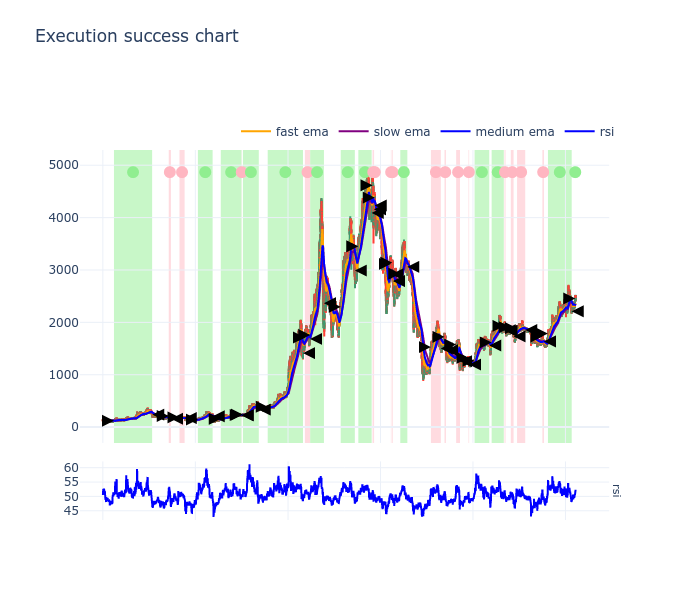

In [ ]:
from tradeexecutor.visual.single_pair import visualise_single_pair_positions_with_duration_and_slippage

fig = visualise_single_pair_positions_with_duration_and_slippage(
    state,
    ExecutionContext(ExecutionMode.backtesting),
    universe.universe.candles.df,
    title="Execution success chart",
    height=600,
)

fig.show("png")

In [ ]:
from tradeexecutor.visual.single_pair import visualise_single_pair
from tradingstrategy.charting.candle_chart import VolumeBarMode

figure = visualise_single_pair(
    state,
    ExecutionContext(ExecutionMode.backtesting),
    universe.universe.candles,
    start_at=datetime.datetime(2021, 1, 1),
    end_at=datetime.datetime(2022, 6, 1),
    height = 1000,
    volume_bar_mode=VolumeBarMode.hidden
)

# figure.show("png")
figure.show()

In [ ]:
# from tradeexecutor.backtest.grid_search import perform_grid_search, prepare_grid_combinations

# # This is the path where we keep the result files around

# combinations = prepare_grid_combinations(StrategyParameters, storage_folder)
# print(f"We prepared {len(combinations)} grid search combinations")

# grid_search_results = perform_grid_search(
#     decide_trades,
#     strategy_universe,
#     combinations,
#     max_workers=8,
#     trading_strategy_engine_version="0.4",
#     multiprocess=False,
# )

# Grid search result table

- Show individual profit and risk for each grid combination

In [ ]:
# Set Jupyter Notebook output mode parameters
from tradeexecutor.analysis.grid_search import analyse_grid_search_result
from tradeexecutor.analysis.grid_search import visualise_table

# Print extension of our backtest
print(f"Grid search combinations available: {len(grid_search_results)}")

table = analyse_grid_search_result(grid_search_results)
visualise_table(table)

NameError: name 'grid_search_results' is not defined

# Heatmap

- Verify that results look to cluster around certain values and do not follow a random pattern
- As we are grid searching three different parameters, we need to lock one parameter (rsi_days)

In [ ]:
from tradeexecutor.analysis.grid_search import visualise_heatmap_2d

# Remove one extra axis by focusing only rsi_threshold=65
heatmap_data = table.xs(9, level="rsi_days")

# Draw heatmaps for two different metrics
fig = visualise_heatmap_2d(heatmap_data, "rsi_low", "rsi_high", "Annualised return")
display(fig)


# Equity curve comparison

- Compare the equity curves of all grid search results
- Show the grid search parameters as the tool tip
- Add buy and hold benchmarks on the plot

In [ ]:
from tradeexecutor.analysis.grid_search import visualise_grid_search_equity_curves
from tradeexecutor.visual.benchmark import create_benchmark_equity_curves

benchmark_indexes = create_benchmark_equity_curves(
    strategy_universe,
    {"BTC": our_pairs[0], "ETH": our_pairs[1]},
    initial_cash=StrategyParameters.initial_cash,
)

fig = visualise_grid_search_equity_curves(
    grid_search_results,
    benchmark_indexes=benchmark_indexes,
)
fig.show()

# 3d scatter plot

- Draw an interactive 3d cube to visualise grid search results
- Visualise 3d scatter plot of all three grid searched parameters
- This is somewhat hard to read in its current format

**Note**: Github viewer does not support interactive charts.

In [ ]:
from tradeexecutor.analysis.grid_search import visualise_3d_scatter

flattened_results = table.reset_index()
flattened_results["Annualised return %"] = flattened_results["Annualised return"] * 100

fig = visualise_3d_scatter(
    flattened_results,
    parameter_x="rsi_days",
    parameter_y="rsi_high",
    parameter_z="rsi_low",
    measured_metric="Annualised return %"
)
fig.show()

In [ ]:
print("All ok")